In [1]:
import textract
import re
import nltk
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
from nltk.corpus import stopwords

In [2]:
BAD_SYMBOLS_RE = re.compile('[^\.0-9A-Za-z #+_]')
STOPWORDS = set(stopwords.words('english'))
REPLACE_BY_SPACE_RE = re.compile('[/(){}\[\]\|@,;:\s]')


def read_file(path):
    text = textract.process(path)
    text = text.decode('utf-8')
    text = REPLACE_BY_SPACE_RE.sub(' ', text) # replace REPLACE_BY_SPACE_RE symbols by space in text
    text = BAD_SYMBOLS_RE.sub('', text) # delete symbols which are in BAD_SYMBOLS_RE from text
    text = ' '.join(word for word in text.split() if word not in STOPWORDS)
    return text

In [3]:
r"\\(d+)\\([A-Za-z]+)\.?\d+\\([A-Za-z]|\s)+(\d+)"

'\\\\(d+)\\\\([A-Za-z]+)\\.?\\d+\\\\([A-Za-z]|\\s)+(\\d+)'

In [452]:
from dateutil import parser

keywords = ['fired', 'f16', 'plane', 'fighter', 'strike', 'weapon', 'armor', 'armour', 'arm', 'dead', 'died', 'explosion', 'explosive', 'aircraft', 'force', 'unit', 'death', 'casualt', 'helicopter', 'drone', 'gun', 'shot', 'shoot', 'detonate', 'bulldozer', 'fire', 'injur', 'idf', 'milit', 'qassam', 'missile', 'troop', 'artillery', 'wound', 'rocket', 'explode', 'penetrate', 'fatalit', 'tank', 'iaf', 'grenade', 'damage', 'shell', 'mortar']

def parse_format1(path):
    match = re.search(r"/(\d+)/([A-Za-z]+).*/(([A-Za-z]|\s)*)(\d+)", path)
    year = match.group(1)
    month = match.group(2)
    day = match.group(5)
    
    try:
        dt = parser.parse(day + ' ' + month + ' ' +  year)
    except:
        print(f'Error parsing file {path}: wrong date format')
        return
    
    text = read_file(path)
    text_lower = text.lower()
#     print(text_lower.index('security update'))
    def find_index(text, iterable, default=0):
        for item in iterable:
            if item in text:
                return text.index(item)
        else:
            return default
        
    start_idx = find_index(text_lower, ('area summary (24 hours)', 'area summary 24 hours'), 0)
    end_idx = find_index(text_lower, ('incident statistics', 'incidents gaza number', 'statistics', 'gaza travel advisory'), len(text_lower))
    if end_idx == len(text_lower):
        print(f'Error processing file {path}: different format')

    text = text[start_idx: end_idx]
    if len(text) == 0:
        print(start_idx,  end_idx)
        print(f'weird parsing error in {path}')
        return
    
    text_lower = text.lower()
    
    headings = [('1. rafah:', '1. rafah', 'rafah:', 'rafah'), ('2. khan younis', '2. khan yunis', '2. khan yunis:', 'khan yunis:', '2. khan younis:', 'khan younis:', 'khan yunis', 'khan younis'), 
                ('3. middle area', '3. middle', '3. middle area:', 'middle area:', '3. middle:', 'middle:', 'middle area', 'middle'), ('4. north and gaza', '4. gaza', '4. north and gaza:', 'north and gaza:', '4. north:', 'north:', 'north and gaza', 'north')]
    
    # terrible code
    def index(text, i):
        if isinstance(headings[i], tuple):
            for h in headings[i]:
                if h in text:
                    headings[i] = h
                    return text.index(h)
        else:
            return text_lower.index(headings[i])
        
        raise Exception("Couldn't find " + '|'.join(headings[i]) + 'in file ' + path + 'in ' + text)
        return -1


    idxs = [index(text_lower, i) for i in range(len(headings))]
    headings = sorted(enumerate(headings), key=lambda x: idxs[x[0]])
    headings = [x[1] for x in headings]
    headings = [re.sub(r'[^ a-zA-Z]', '', h).strip() for h in headings]

    idxs = idxs + [len(text)]
    idxs = sorted(idxs)

    paragraphs = [text[idxs[i] + len(headings[i]):idxs[i+1]] for i in range(len(idxs) - 1)]
    paragraphs = [paragraph.strip().lstrip('.').strip() for paragraph in paragraphs]
        
    res = {}

    for area, paragraph in zip(headings, paragraphs):
        parts = []
        default_time = parser.parse(f'{day} {month} {year} 00:00')
        paragraph = [sentence for sentence in paragraph.split('.') if sentence.strip() and len(sentence) > 4]
        for sentence in paragraph:
            match = re.search(r"([0-1][0-9]|2[0-3])([0-5][0-5])", sentence)
            marked = any(keyword in sentence for keyword in keywords)
            if match:
                try:
                    dt = parser.parse(f'{day} {month} {year} {match.group(1)}:{match.group(2)}')
                except:
                    if match.group(1) == '24':
                        dt = parser.parse(f'{day} {month} {year} 00:{match.group(2)}')
                    else:
                        dt = default_time
                        print(match)
                parts.append({'time': dt, 'content': [sentence], 'marked': marked})
            else:
                if not parts:
                    parts.append({'time': default_time, 'content': [sentence], 'marked': marked})
                else:
                    parts[-1]['content'] += [sentence]
                    if marked:
                        parts[-1]['marked'] = True
        
        for part in parts:
            part['content'] = '.'.join(part['content']).strip()
        res[area] = {'events': parts, 'text': '.'.join(paragraph).strip()}
        
    return res

In [453]:
import glob
paths = [r"Word/Format 1/", r"Word/Format 2/", r"Word/Format 4/"]
from os import listdir
from os.path import isfile, join

# files = glob.glob(join(path, "*/*/*.doc"))
files = [f for path in paths for f in glob.glob(join(path, "*/*/*.doc")) if '~' not in f]
# files = [f for f in listdir(path) if isfile(join(path, f)) and f.endswith('.doc') or f.endswith('.docx')]

In [454]:
from tqdm.notebook import tqdm

data = []
for file in tqdm(files):
    x = parse_format1(file)
    if x:
        data.append({'file': file, **x})


  0%|          | 0/2359 [00:00<?, ?it/s]

Error processing file Word/Format 1/2008/dec08/Sitrep 28 December 2008.doc: different format
Error parsing file Word/Format 1/2007/Feb 2007/Gaza Security Update 31 January 2007.doc: wrong date format
Error processing file Word/Format 2/2013/April/Gaza Security Update 28 Apr 13.doc: different format
Error processing file Word/Format 2/2013/April/Gaza Security Update 25 Apr 13.doc: different format
Error processing file Word/Format 2/2013/April/Gaza Security Update 12 Apr 13.doc: different format
Error processing file Word/Format 2/2013/April/Gaza Security Update 17 Apr 13.doc: different format
Error processing file Word/Format 2/2013/April/Gaza Security Update 20 Apr 13.doc: different format
Error processing file Word/Format 2/2013/April/Gaza Security Update 06 Apr 13.doc: different format
Error processing file Word/Format 2/2013/April/Gaza Security Update 01 Apr 13.doc: different format
Error processing file Word/Format 2/2013/April/Gaza Security Update 10 Apr 13.doc: different format


Error processing file Word/Format 2/2013/June/Gaza Security Update 01 Jun 13.doc: different format
Error processing file Word/Format 2/2013/June/Gaza Security Update 27 Jun 13.doc: different format
Error processing file Word/Format 2/2013/June/Gaza Security Update 10 Jun 13.doc: different format
Error processing file Word/Format 2/2013/June/Gaza Security Update 09 Jun 13.doc: different format
Error processing file Word/Format 2/2013/June/Gaza Security Update 15 Jun 13.doc: different format
Error processing file Word/Format 2/2013/June/Gaza Security Update 22 Jun 13.doc: different format
Error processing file Word/Format 2/2013/June/Gaza Security Update 04 Jun 13.doc: different format
Error processing file Word/Format 2/2013/June/Gaza Security Update 18 Jun 13.doc: different format
Error processing file Word/Format 2/2013/July/Gaza Security Update 24 Jul 13.doc: different format
Error processing file Word/Format 2/2013/July/Gaza Security Update 13 Jul 13.doc: different format
Error proc

Error processing file Word/Format 2/2013/March/Gaza Security Update 31 Mar 13.doc: different format
Error processing file Word/Format 2/2013/March/Gaza Security Update 06 Mar 13.doc: different format
Error processing file Word/Format 2/2013/March/Gaza Security Update 17 Mar 13.doc: different format
Error processing file Word/Format 2/2013/March/Gaza Security Update 20 Mar 13.doc: different format
Error processing file Word/Format 2/2013/March/Gaza Security Update 12 Mar 13.doc: different format
Error processing file Word/Format 2/2013/March/Gaza Security Update 28 Mar 13.doc: different format
Error processing file Word/Format 2/2013/March/Gaza Security Update 03 Mar 13.doc: different format
Error processing file Word/Format 2/2013/March/Gaza Security Update 04 Mar 13.doc: different format
Error processing file Word/Format 2/2013/March/Gaza Security Update 18 Mar 13.doc: different format
Error processing file Word/Format 2/2013/March/Gaza Security Update 09 Mar 13.doc: different format


In [455]:
data[-1]

{'file': 'Word/Format 2/2012/September/Gaza Security Update 30 September12.doc',
 'rafah': {'events': [{'time': datetime.datetime(2012, 9, 30, 0, 0),
    'content': '29 Sep Rafah terminal open Palestinians directions. 785 persons reportedly exited Gaza Strip Egypt. 848 persons entered Gaza Strip 72 persons denied access Egypt',
    'marked': False}],
  'text': '29 Sep Rafah terminal open Palestinians directions. 785 persons reportedly exited Gaza Strip Egypt. 848 persons entered Gaza Strip 72 persons denied access Egypt'},
 'khan younis': {'events': [], 'text': ''},
 'middle area': {'events': [{'time': datetime.datetime(2012, 9, 30, 2, 0),
    'content': '30 Sep 0200 hrs Hamas militant died tunnel digging collapsed Nuseirat camp',
    'marked': True}],
  'text': '30 Sep 0200 hrs Hamas militant died tunnel digging collapsed Nuseirat camp'},
 'north and gaza': {'events': [{'time': datetime.datetime(2012, 9, 30, 16, 0),
    'content': '28 Sep 1600 hrs IDF positioned border fence northwest

In [458]:
import json

with open('data.json', 'w') as f:
    json.dump(data, f, default=str)

In [457]:
re.search(r"/(\d+)/([A-Za-z]+).*/(([A-Za-z]| )*)(\d+)", r'Word/Format 1/2012/April/Gaza Security Update 01April 12.doc').group(5)


'01'

In [77]:
parse_format1(files[0])

AttributeError: 'NoneType' object has no attribute 'group'

In [97]:
from collections import Counter
from tqdm.notebook import tqdm

ps = PorterStemmer()
counts = Counter()


for file in tqdm(files):
    text = read_file(file)
    data = parse_format1(text)
    for area in data:
        sentences = [sentence for sentence in data[area].split('.') if sentence]
        for sentence in sentences:
            for word in word_tokenize(sentence):
                counts[word.lower()] += 1
#             if 'kill' in sentence:
#                 print(area)
#                 print(sentence)
#                 counts['kill'] += 1
#             if 'injur' in sentence:
#                 print(area)
#                 print(sentence)
#                 counts['injur'] += 1

#             sentence = word_tokenize(sentence)
#             filtered_words = [word for word in sentence if word not in stopwords.words('english')]

#         #     sentences = list(map(ps.stem, sentences))
#             text = nltk.pos_tag(sentence)

#         print(text)

  0%|          | 0/1116 [00:00<?, ?it/s]

SECURITY PHASE IV SUNSET 1930 hrs SITUATION OVERVIEW Today IDF CLA advised Erez BCP open 1100 1500 hrs. 1. In view recent events ASC a.i. directs following precautionary measures immediate effect notice a. International staff accommodation sunset Not Later Than 1930hrs. b. Movement Rimal Zone Hardened Vehicle SoftSkin escort. c. Designated recreational venues temporarily bounds. d. Travel Rafah Governorate currently permitted essential missions. e. Hotel accommodation international SMs permitted El Deirra hotel only. 2. Measures reviewed daily subject change. Staff reminded stay away government ministries Hamas security offices police stations area legislative council military courts public places. To avoid Sabra area remain alert next days case retaliation. The general security situation unpredictable staff must remain alert vigilant report suspected activity especially around UN compounds International residences. All reports suspicious activity reported FSCO immediately security gua

SECURITY PHASE IV SUNSET 1945 hrs SITUATION OVERVIEW IDF CLA announced temporary change operating hours Erez Crossing today 07Aug09 effective today only. Operating hours follows Temporary Closure 0730 1100hrs Open 1100 1500hrs Closed 1500hrs Colleagues intending depart Gaza plan report Hamsa Hamsa Not Later Than 1420hrs. Several IDF armoured vehicles penetrated c200m inside Gazan territory east Gaza conducted levelling operation withdrawal. AREA SUMMARY 24 hours 1. RAFAH . NTR 2. KHAN YOUNIS . NTR 3. MIDDLE AREA . NTR 4. NORTH AND GAZA . 06 Aug 1300 hrs 4 IDF bulldozers supported 4 tanks penetrated c200 meters inside Gazan territory Karni Nahal Oz crossings east Gaza cover sporadic gunfire. The bulldozers conducted excavation levelling operation. At 1845hrs militants fired 2 RPGs towards penetrated troops meanwhile IDF retaliated HMG fire 10 minutes. At 1925hrs IDF troops withdrew border line. INCIDENT STATISTICS Incidents Gaza Number Suicide Attacks Targeting killing Kidnapping Improv

SECURITY PHASE IV SUNSET 1945 hrs SITUATION OVERVIEW IDF CLA announced temporary change operating hours Erez Crossing Friday 07Aug09 effective date only. Operating hours follows Temporary Closure 0730 1100hrs Open 1100 1500hrs Closed 1500hrs Colleagues intending depart Gaza plan report Hamsa Hamsa Not Later Than 1420hrs. Rafah crossing opened allow Palestinian patients students residency holders cross Gaza Egypt. In 2 separate incidents IDF marine vessels fired 9 blank rounds targeting Palestinian fishing boats west Beit Lahia forcing ashore. No injuries reported. IDF marine vessels pursued Palestinian fishing boats arrested 3 fishermen west Khan Younis. The IDF confiscated 1 fishing boat. AREA SUMMARY 24 hours 1. RAFAH . 05 Aug 1000 hrs Rafah terminal open directions patients students residency holders. 1081 persons crossed terminal Egypt 119 denied access 456 persons returned Gaza Strip. Unconfirmed reports indicate terminal may open today non Palestinians only. 2. KHAN YOUNIS . 06 A

SECURITY PHASE IV SUNSET 1945 hrs SITUATION OVERVIEW Rafah crossing opened allow Palestinian patients students residency holders cross Gaza Egypt. Two brothers wounded IED exploded home Al Bureij camp collecting metal. A tunnel collapsed border Gaza Egypt. The rescue team managed evacuate 1 dead body. 20 unknown militants broke Al Quds Open University Salah Eddin road Al Bureij camp tore posters damaged windows university. Hamas movement organized demonstration Jabalia camp protest death Sheikh Kamal Abu Taimah West Bank died Jordanian hospital. AREA SUMMARY 24 hours 1. RAFAH . 04 Aug 1000 hrs Rafah terminal open directions patients students residency holders. 900 persons crossed terminal Egypt 40 denied access 500 persons returned Gaza Strip. It expected terminal open today 3rd consecutive day. . 04 Aug 2000 hrs tunnel collapsed border Gaza Egypt. The rescue team managed evacuate 1 dead body. 2. KHAN YOUNIS . NTR. 3. MIDDLE AREA . Late report 04 Aug 0200 hrs 20 unknown persons broke A

SECURITY PHASE IV SUNSET 1945 hrs SITUATION OVERVIEW Rafah crossing opened allow Palestinian patients students residency holders cross Gaza Egypt A tunnel collapsed border Gaza Egypt resulted 1 killed 2 sustained wounds. 2 IDF tanks 2 bulldozer penetrated c150m Palestinian Authority land north Bedouin village northeast Beit Lahia. The IDF troops conducted levelling excavation operation. AREA SUMMARY 24 hours 1. RAFAH . 03 Aug 1000 hrs Rafah terminal open directions patients students residency holders. 1 000 persons crossed terminal Egypt 120 denied access 500 persons returned Gaza Strip. It expected terminal open today 2nd consecutive day. . 03 Aug 1800 hrs tunnel collapsed border Gaza Egypt. The rescue team managed evacuate 1 dead body 2 sustained wounds. Meanwhile 2 persons still trapped inside tunnel. 2. KHAN YOUNIS . NTR. 3. MIDDLE AREA . NTR. 4. NORTH AND GAZA . 03 Aug 1600 2 IDF tanks 2 bulldozer penetrated c150m Palestinian Authority land north Bedouin village northeast Beit Lah

SECURITY PHASE IV SUNSET 1745 hrs I. SITUATION OVERVIEW Yesterday Rafah terminal open allow 39 representatives Hamas Islamic Jihad PFLP DFLP cross Gaza. IDF manning border line east El Maghazi camp opened fire targeting group farmers east Al Maghazi camp. 1 injury reported. EREZ CROSSING All UN staff briefed regarding walking tunnel receive GSCO JSCO security briefing UNDSS. No UN staff member use pedestrian tunnel unless received briefing. If staff sure procedures employed security company tunnel please contact FSCO Gaza. Some staff members subject humiliating strip searches tunnel FSCO aware personnel exit tunnel. The tunnel used UN staff unless absolutely necessary delivery emergency humanitarian assistance Gaza. The situation Erez unpredictable staff take extra care area. Staff remain hardened vehicles make use flak jackets depending situation. To remind staff sunset 1745 hrs travel Erez Gaza City permitted dark. Only urgent cases prior approval FSCO ASC travel permitted dark hours

SECURITY PHASE IV SUNSET 1745 hrs I. SITUATION OVERVIEW 2 young boys killed Zaitoun quarter dealing unexploded ordinance. Rafah terminal open allow 1 person enter Gaza. Unknown militants blew shrine Sheikh Ali Al Eryan Khan Younis. It reported Sufi group considers holy symbol. EREZ CROSSING All UN staff briefed regarding walking tunnel receive GSCO JSCO security briefing UNDSS. No UN staff member use pedestrian tunnel unless received briefing. If staff sure procedures employed security company tunnel please contact FSCO Gaza. Some staff members subject humiliating strip searches tunnel FSCO aware personnel exit tunnel. The tunnel used UN staff unless absolutely necessary delivery emergency humanitarian assistance Gaza. The situation Erez unpredictable staff take extra care area. Staff remain hardened vehicles make use flak jackets depending situation. To remind staff sunset 1745 hrs travel Erez Gaza City permitted dark. Only urgent cases prior approval FSCO ASC travel permitted dark ho

SECURITY PHASE IV SUNSET 1745 hrs I. SITUATION OVERVIEW Israeli marine vessels opened fire targeting fishing boats west Gaza city injuring one. Rafah terminal open allow 5 persons enter Gaza. 1 person departed Gaza. EREZ CROSSING All UN staff briefed regarding walking tunnel receive GSCO JSCO security briefing UNDSS. No UN staff member use pedestrian tunnel unless received briefing. If staff sure procedures employed security company tunnel please contact FSCO Gaza. Some staff members subject humiliating strip searches tunnel FSCO aware personnel exit tunnel. The tunnel used UN staff unless absolutely necessary delivery emergency humanitarian assistance Gaza. The situation Erez unpredictable staff take extra care area. Staff remain hardened vehicles make use flak jackets depending situation. To remind staff sunset 1745 hrs travel Erez Gaza City permitted dark. Only urgent cases prior approval FSCO ASC travel permitted dark hours. UN vehicles crossing Erez Israel collecting staff Khamsa 

SECURITY PHASE IV SUNSET 1745 hrs I. SITUATION OVERVIEW 2 PRC militants injured explosive device preparing went off. IAF aircraft fired 2 missiles targeting tunnels area EgyptGaza border. IAF aircraft fired 1 missile targeting 2 Islamic Jihad activists Beit Lahia Project. One two members killed another injured addition another passersby wounded. Israeli marine vessels opened fire targeting fishing boats west Rafah. No injuries reported. Militants fired 2 RPG targeting IDF OP. located border fence south east Al Maghazi camp. IDF responded heavy fire. No injuries reported. Islamic Jihad militants fired 4 mortar shells east Al Maghazi camp towards Green Line east. In response IAF drone fired 2 missiles targeting mortars launching site. 2 Islamic Jihad militants killed 2 wounded. An IED exploded inside Caf Shop Al Maghazi camp. No injuries reported. Militants fired 1 mortar shell east Shejaya targeting IDF OP border line east Gaza City. The IDF retaliated heavy fire. No injuries reported. 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



SECURITY PHASE IV SUNSET 1645 hrs I. SITUATION OVERVIEW In view increased rocket range Designated Official Security I WB G directed Gaza Strip buffer zone extended 40Km. A security advisory subject distributed. IDF Operation Cast Lead entered 15th day Intensive air strikes Israeli Air Force continued. The total number fatalities since beginning attacks Gaza Saturday morning 27 December 2008 remains uncertain estimates ranging 810 fatalities approximately 3 300 injuries. Targets included several homes Hamas activists governmental buildings ministries metal workshops mosques tunnels along border Egypt. During reporting period Palestinian f actions responded 17 homemade Gradtype rockets several mortar shells towards Israeli targets. IDF troops still occupying several parts Gaza Strip. Armoured elements occupy control ground Karni Crossing Netzarim Junction Netzarim Johr Eddik area northeast Bureij camp Al Zahra city northwest Nuseirat camp coastal road effectively isolating Gaza North Gov

SECURITY PHASE IV SUNSET 1945 hrs SITUATION OVERVIEW The security situation quiet reporting period. Yesterday Hamas movement sent children participating summer camps demonstrate front Rafah terminal calling Egypt open border crossing. AREA SUMMARY 24 hours 1. Rafah . 13 July 1100 hrs Hamas movement sent children participating summer camps demonstrate front Rafah terminal calling Egypt open border crossing. 200 children participated demonstration ended incident 1200 hrs. 2. KHAN YOUNIS . NTR. 3. MIDDLE AREA . NTR. 4. NORTH AND GAZA . NTR. INCIDENT STATISTICS Incidents Gaza Number Suicide Attacks Targeting killing Kidnapping Improvised Explosive Device IED Indirect fire attack Armed Incidents Demonstrations 1 Physical Detention Burglary Theft Vehicle accidents Search operations Militant Rockets Mortars RPGs Rockets Propelled Grenades Anti tank rockets fired IDF Shelling attacks IAF air strikes IDF Incursion IDF Firing Gaza strip e.g. across Green Line Fatalities Casualties IDF operations

SECURITY PHASE IV SUNSET 1945 hrs SITUATION OVERVIEW Unknown militants fired 2 mortar shells east Abu El Ajeen area east Deir El Balah targeting Kissufim IDF military base. 1 shells exploded prematurely. A Hamas militant shot killed accidentally cleaning rifle Beit Hanoun. Hamas police broke wedding party belonging Al Madhon family Beit Lahia project postered pictures Sameeh Al Madhon Fatah leader northern area. Police opened fire disperse people 4 injuries reported. 3 tanks 4 bulldozers penetrated c200 meters inside Palestinian territory territory northeast Beit Hanoun near border fence. The bulldozers conducted excavation levelling operation area. At 1940hrs IDF withdrew border line. AREA SUMMARY 24 hours 1. Rafah . NTR. 2. KHAN YOUNIS . NTR. 3. MIDDLE AREA . 15 July 2250 hrs unknown militants fired 2 mortar shells east Abu Al Ajeen area east Deir El Balah targeting Kissufim IDF military base. 1 shells exploded prematurely. 4. NORTH AND GAZA . Late report 14 July 1400 hrs 23year old 

SECURITY PHASE IV SUNSET 1945 hrs SITUATION OVERVIEW Hamas movement plans organize demonstrations across 5 governorates Gaza Strip 4th prayers c2015hrs starting 28Jul 09 3Aug protest arrest members supporters PA security forces West Bank. Today Hamas movement plans organize demonstrations across middle area governorates Gaza Strip 4th prayers c2015hrs protest arrest members supporters PA security forces West Bank. IDF manning border line east Khan Younis opened fire targeting Palestinian farmers forcing leave fields. No injuries reported. IDF troops penetrated c200m Palestinian territory east Jabalia. The IDF conducted levelling operation. Militants fired RPGs targeting penetrating troops. 6 Palestinians wounded tunnel collapse border Gaza Egypt. Gaza ministry interior announced Rafah terminal partially open directions 3 days 0305 August 2009. AREA SUMMARY 24 hours 1. RAFAH . 28 July 2015 hrs Hamas movement organised demonstration Rafah protest arrest campaign supporters PA security fo

SECURITY PHASE IV SUNSET 1945 hrs SITUATION OVERVIEW DFLP organized demonstration Gaza city demanding Hamas Fatah make concessions reach national agreement. IDF marine vessels opened fire targeting Palestinian fishing boats west Beit Lahia forcing ashore. No injuries reported. AREA SUMMARY 24 hours 1. RAFAH . NTR. 2. KHAN YOUNIS . NTR 3. MIDDLE AREA . NTR 4. NORTH AND GAZA . 25 July 1100 hrs DFLP organized demonstration Gaza city demanding Hamas Fatah make concessions reach national agreement. 15 000 demonstrators moved municipality park Omar Al Mokhtar street PLC. At 1300 hrs demonstration ended peacefully. . 25 July 2240 hrs IDF marine vessels opened fire targeting Palestinian fishing boats 10 minutes west Beit Lahia forcing ashore addition several flare lights fired. No injuries damage reported. INCIDENT STATISTICS Incidents Gaza Number Suicide Attacks Targeting killing Kidnapping Improvised Explosive Device IED Indirect fire attack Armed Incidents Demonstrations 1 Physical Detentio

SECURITY PHASE IV SUNSET 1740 hrs SITUATION OVERVIEW 3 HMR fired Gaza Strip Israel reporting period. IAF aircrafts fired 3 missiles targeting smuggling tunnels along Gaza Strip border Egypt Gaza. No injuries reported. AREA SUMMARY 24 hours 1. RAFAH . 30 Sep 00150120 hrs IAF aircrafts fired 3 missiles targeting smuggling tunnels EgyptGaza border opposite Al Salam quarter Block O Rafah city. No injuries reported. Israeli sources reported IAF aircrafts destroyed number weapons smuggling tunnels southern Gaza Strip response firing two rockets Israel Tuesday evening. 2. KHAN YOUNIS . NTR. 3. MIDDLE AREA . NTR. 4. NORTH AND GAZA . 29 Sep 1910 hrs Israeli sources reported Colour Red alert sounded Eshkol Regional Council area following rocket launched northern Gaza. . 29 Sep 2030 hrs unknown militants fired 1 HMR Beit Lahia Israel. Israeli sources reported rocket fired northern Gaza Strip exploding open area south Ashkelon. No injuries damage reported. . 29 Sep 2100 hrs unknown militants fired

SECURITY PHASE IV SUNSET 1740 hrs SITUATION OVERVIEW 5 Palestinians died wounds sustained result gas cylinder explosion restaurant Jabalia camp 17 Sep. c1 000 Female Hamas activists organized demonstration Gaza city protest incursion Al Aqsa Mosque. Islamic Jihad Movement organized demonstration Gaza city protest Al Aqsa Mosque incursion. c3 000 people participated demonstration. 7 HMR fired Gaza Strip towards Western Negev reporting period. In response IAF drone fired 1 missile targeting rocket launching site resulting injuries. Meanwhile Hamas militants fired 2 tests HMR Barcelona area southwest Gaza city towards sea. An explosive device detonated Hamas affiliated militants preparing house Nuseirat camp causing minor damage injuries. AREA SUMMARY 24 hours 1. RAFAH . 28 Sep 1910 hrs militants fired 2 HMR east Rafah towards Western Negev. No response IDF. Al Aqsa Martyrs Brigades military wing Fatah clamed responsibility. 2. KHAN YOUNIS . NTR. 3. MIDDLE AREA . 28 Sep 2215 hrs internal 

SECURITY PHASE IV SUNSET 1800 hrs SITUATION OVERVIEW 1. IDF CLA advise temporary change Erez Crossing operating hours due maintenance Friday 11Sep Sunday 13Sep follows a. FRIDAY 11Sep 07300830hrs 13001400hrs. b. SUNDAY 13Sep 07000900hrs 13301600hrs. 2. For Vehicle Pedestrian crossing directions. 3. Israeli Time applies. The general security situation unpredictable staff must remain alert vigilant report suspected activity especially around UN compounds International residences. All reports suspicious activity reported UNDSS immediately security guards briefed proactive tours duty outside patrols UN premises. Suspicious vehicles receive particular attention details recorded. Staff advised take extra care especially travelling visiting near Hamas security establishments drivers UN vehicles distance Hamas security vehicles. 2 tanks 1 bulldozer penetrated Gazan territory north east Al Maghazi camp. The bulldozers conducted levelling excavation operations withdrawal 1530hrs. PFLP militants 

SECURITY PHASE IV SUNSET 1750 hrs SITUATION OVERVIEW 3 Palestinians wounded mistakenly due shooting air funeral Islamic Jihad militants Gaza city. During burial ceremony 2 Islamic Jihad militants Eastern Cemetery East Jabalia group youths approached border fence began stoning IDF post there. The IDF retaliated HMG warning fire forcing leave area. No injuries reported. 1 mortar shell 2 HMR fired Gaza Strip towards Israeli targets reporting period. IDF marine vessels opened fire targeting Palestinian fishing boats west Beit Lahia forcing ashore. No injuries damage reported. AREA SUMMARY 24 hours 1. RAFAH . NTR. 2. KHAN YOUNIS . 27 Sep 0530 hrs unknown militants fired 2 HMR Khan Younis city towards Western Negev. In response IDF border troops fired several shells targeting open areas east Al Qarara east Khan Younis. No injuries reported. 3. MIDDLE AREA . 26 Sep 2310 hrs unknown militants fired 1 mortar shell form Abu Al Ajeen area southeast Deir El Balah city targeting Kissufim military b

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



SECURITY PHASE IV SUNSET 1930 hrs I. SITUATION OVERVIEW Labour groups conduct rally mark Labour Day today 30 April. The participants congregate Palestine Square 1100hrs proceed UNSCO compound 1230hrs. There reportedly deliver letter addressed Secretary General United Nations expressing appreciation United Nations assistance people Palestine. A group Special Hardship Case recipients gathered UNRWA Nuseirat Camp Relief Centre protest delay receiving cash assistance subsidy. The protestors presented letter addressed Director UNRWA Operations. At 1030hrs left Centre. In two different incidents IDF patrol boats fired several shells targeting sea shore west Rafah opened fire targeting fishing boats west Deir Al Balah. No injuries reported. Yesterday Rafah terminal open allow 34 Palestinians return Gaza. AREA SUMMARY 24 hours 1. Rafah . 29 Apr 13001700 hrs Rafah terminal open allow 34 Palestinians including patients journalists return Gaza Strip. . 29 Apr 2000 hrs IDF marine vessels fired sev

SECURITY PHASE IV SUNSET 1900 hrs I. SITUATION OVERVIEW PFLP organized demonstration Khan Younis support national dialogue national unity 1 500 people participated. Yesterday Rafah terminal open allow Hamas delegation 12 members 1 Fatah 4 Palestinian patients four lawyers enter Gaza Strip. IDF marine vessels opened fire targeting Palestinian fishing boats across sea west Rafah. No injuries reported. EREZ CROSSING All UN staff briefed regarding walking tunnel receive GSCO JSCO security briefing UNDSS. No UN staff member use pedestrian tunnel unless received briefing. If staff sure procedures employed security company tunnel please contact FSCO Gaza. Some staff members subject humiliating strip searches tunnel FSCO aware personnel exit tunnel. The tunnel used UN staff unless absolutely necessary delivery emergency humanitarian assistance Gaza. The situation Erez unpredictable staff take extra care area. Staff remain hardened vehicles make use flak jackets depending situation. To remind s

SECURITY PHASE IV SUNSET 1900 hrs I. SITUATION OVERVIEW IDF stationed border line east Khuzaa east Khan Younis opened fire targeting group Palestinian farmers international peace activist group journalists. No injuries reported. EREZ CROSSING All UN staff briefed regarding walking tunnel receive GSCO JSCO security briefing UNDSS. No UN staff member use pedestrian tunnel unless received briefing. If staff sure procedures employed security company tunnel please contact FSCO Gaza. Some staff members subject humiliating strip searches tunnel FSCO aware personnel exit tunnel. The tunnel used UN staff unless absolutely necessary delivery emergency humanitarian assistance Gaza. The situation Erez unpredictable staff take extra care area. Staff remain hardened vehicles make use flak jackets depending situation. To remind staff sunset 1900 hrs travel Erez Gaza City permitted dark. Only urgent cases prior approval FSCO ASC travel permitted dark hours. UN vehicles crossing Erez Israel collecting 

SECURITY PHASE IV SUNSET 1700 hrs SITUATION OVERVIEW 3 IAF air strikes targeted metal workshops smuggling tunnels response homemade rocket fired Gaza towards Israel. A smuggling tunnel collapsed opposite Brazil quarter border Egypt Gaza. The Palestinian medical rescue team managed evacuate 1 injury dead body. A Palestinian shot killed due financial dispute member Doghmosh family. IDF marine vessels opened fire sporadically targeting Palestinian fishing boats across sea west Rafah forcing ashore. AREA SUMMARY 24 hours 1. RAFAH . 22 Nov 0000 hrs smuggling tunnel collapsed opposite Al Brazil quarter border Egypt Gaza. 1 Palestinian killed another 1 injured. . 22 Nov 0045 hrs IAF aircraft attacked smuggling tunnels Block O Rafah along Gaza Strip border Egypt resulting 4 injuries. . 22 Nov 0050 hrs IDF marine vessels opened fire sporadically targeting Palestinian fishing boats across sea west Rafah forcing ashore. No injuries damage reported. 2. KHAN YOUNIS . NTR. 3. MIDDLE AREA . 22 Nov 00

SECURITY PHASE IV SUNSET 1700 hrs SITUATION OVERVIEW 1. IDF CLA latterly report change Erez Crossing operating hours today Monday 23Nov09. VEHICLE LANES 2. Open. a. 0700 0900hrs b. 1400 1600hrs 1 Last exiting vehicles report Hamsa Hamsa strictly later 0825hrs subsequently 1525hrs. 3. Closed. 0901 1359hrs. PEDESTRIAN LANE 4. Open Gaza Israel. 0800 1500hrs. 5. Open Israel Gaza. 0800 1900hrs. AREA SUMMARY 24 hours 1. RAFAH . NTR. 2. KHAN YOUNIS . NTR. 3. MIDDLE AREA . NTR. 4. NORTH AND GAZA . NTR. INCIDENT STATISTICS Incidents Gaza Number Suicide Attacks Targeting killing Kidnapping Improvised Explosive Device IED Indirect fire attack Armed Incidents Demonstrations Physical Detention Burglary Theft Vehicle accidents Search operations Militant Rockets Mortars RPGs Rockets Propelled Grenades Anti tank rockets fired IDF Shelling attacks IAF air strikes IDF Incursion IDF Firing Gaza strip e.g. across Green Line Fatalities Casualties IDF operations shelling air strike shootings Shootings origi

SECURITY PHASE IV SUNSET 1700 hrs SITUATION OVERVIEW IDF positioned border fence north Beit Lahia shot injured mentally retarded 38 year old male Palestinian tried approach border fence. An IED exploded gate Grand caf shop Al Thalatini Street 50 meters east UNRWA HQ building Gaza City. Minor damage gate injuries reported. AREA SUMMARY 24 hours 1. RAFAH . NTR 2. KHAN YOUNIS . 31 Oct hrs reference IDF troops penetrated near Kissufim east Khan Younis withdrew border line 1320 hrs. 3. MIDDLE AREA . NTR 4. NORTH AND GAZA . 31 Oct 1500 hrs IDF positioned border fence north Beit Lahia shot injured mentally retarded 38 year old male Palestinian tried approach border fence. Palestinian sources reported injured person underwent medical treatment interrogation inside Israeli territory eventually returned Gaza 1700 hrs Erez crossing. . 01 Nov 0420 hrs IED exploded gate Grand caf shop Al Thalatini Street 50 meters east UNRWA HQ building Gaza City. The explosion resulted minor damage gate injuries r

SECURITY PHASE IV SUNSET 1700 hrs SITUATION OVERVIEW The Egyptian Authorities opened Rafah terminal allow Palestinian pilgrims cross Egypt en route Saudi Arabia. The IDF stationed border line east Shijaya east Gaza city fired 1 shell targeted area east eastern road Karni Nahal Oz crossing. 1 person injured. An IDF foot patrol supported 10 armoured vehicle entered c300m east Al Maghazi. Searching operation houses levelling operation lands took place withdrawal. 2 persons arrested. AREA SUMMARY 24 hours 1. RAFAH . The Egyptian Authorities opened Rafah terminal allow 1000 Palestinian pilgrims cross Egypt en route Saudi Arabia. 2. KHAN YOUNIS . NTR 3. MIDDLE AREA . 06 Nov 1500 hrs IDF troops invaded area north east El Bureij withdrew area green line. . 06 Nov 1700 hrs IDF foot patrol supported 4 bulldozer 6 tanks entered c300m Palestinian area east El Maghazi conducted search operation houses. 2 persons arrested. Meanwhile IDF bulldozers conducted levelling excavation operations withdrawal

SECURITY PHASE IV SUNSET 1700 hrs SITUATION OVERVIEW IDF stationed border fence north Beit Lahia opened fire towards group Palestinians forcing leave area. No injuries reported. 2 IDF bulldozers guarded 4 tanks penetrated c200m Gazan territory north Sofa southeast Khan Younis. The bulldozers conducted levelling excavation operations withdrawal. An internal explosion occurred house east Al Qarara north east Khan Younis unknown militants preparing explosive device. The Egyptian Authorities discovered 3 smuggling tunnels Egyptian side destroyed them. An internal family dispute erupted Sabra area Gaza city members Doghmosh family. An exchange fire took place 15 minutes resulting 3 injuries. The police intervened several arrests reported. 3 IDF bulldozers 4 tanks penetrated c200 heavy shooting inside Gazan territory north east El Bureij. The bulldozers conducted levelling excavation operation. AREA SUMMARY 24 hours 1. RAFAH . 05 Nov 1500 hrs Egyptian Authorities discovered 3 smuggling tunne

SECURITY PHASE IV SUNSET 1715 hrs I. SITUATION OVERVIEW 1 HMR 1 mortar shell fired Gaza Strip towards Israeli targets reporting period. An Islamic Jihad militant injured attempt firing mortar shell failed exploded launch site. Israeli Navy seized Lebanese aid boat making way Gaza. They later taken Israels port Ashdod along ship questioning. An IED exploded inside Al Waha caf Unknown Soldier Park area Gaza city. The explosion resulted 1 fatality 4 injuries. Israeli media reported IDF troops Sofa crossing north east Rafah shot killed Palestinian man tried hand grenade towards troops. Yesterday Rafah crossing opened foreigners leaving Gaza. A tunnel Gaza Egypt collapsed opposite Salam quarter Rafah. 4 Palestinians trapped inside tunnel. EREZ CROSSING All UN staff briefed regarding walking tunnel receive GSCO JSCO security briefing UNDSS. No UN staff member use pedestrian tunnel unless received briefing. If staff sure procedures employed security company tunnel please contact FSCO Gaza. So

SECURITY PHASE IV SUNSET 1715 hrs I. SITUATION OVERVIEW An IAF drone fired rocket targeting car travelling Gaza City rocket missed target casualties reported. 3 HMR fired towards Israeli targets reporting period. EREZ CROSSING All UN staff briefed regarding walking tunnel receive GSCO JSCO security briefing UNDSS. No UN staff member use pedestrian tunnel unless received briefing. If staff sure procedures employed security company tunnel please contact FSCO Gaza. Some staff members subject humiliating strip searches tunnel FSCO aware personnel exit tunnel. The tunnel used UN staff unless absolutely necessary delivery emergency humanitarian assistance Gaza. The situation Erez unpredictable staff take extra care area. Staff remain hardened vehicles make use flak jackets depending situation. To remind staff sunset 1715 hrs travel Erez Gaza City permitted dark. Only urgent cases prior approval FSCO ASC travel permitted dark hours. UN vehicles crossing Erez Israel collecting staff Khamsa Kha

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



SECURITY PHASE IV SUNSET 1945 hrs SITUATION OVERVIEW 1 HMR fired Gaza Strip towards Israeli targets reporting period. AREA SUMMARY 24 hours 1. Rafah . NTR. 2. KHAN YOUNIS . NTR. 3. MIDDLE AREA . Late report 30 Jun 0045 hrs unknown militants fired 1 HMR east Deir El Balah towards Western Negev. . 30 Jun 1000 hrs Hamas police delivered c50 summons interrogation Fatah affiliated members middle area. They seized hours released. 4. NORTH AND GAZA . NTR. INCIDENT STATISTICS Incidents Gaza Number Suicide Attacks Targeting killing Kidnapping Improvised Explosive Device IED Indirect fire attack Armed Incidents Demonstrations Physical Detention Burglary Theft Vehicle accidents Search operations Militant Rockets 1 Mortars RPGs Rockets Propelled Grenades Anti tank rockets fired IDF Shelling attacks IAF air strikes IDF Incursion IDF Firing Gaza strip e.g. across Green Line Fatalities Casualties IDF operations shelling air strike shootings Shootings originating IDF Explosion Demonstrations Natural D

SECURITY PHASE IV SUNSET 1940 hrs SITUATION OVERVIEW Today 1100 hrs female Hamas demonstration take place PLC compound protest Qalqilya incidents. Hamas Police Internal Security carried several arrests Fatah elements across Gaza strip. A fisherman injured IDF marine vessels opened fire targeting Palestinian fishing boats west Rafah. AREA SUMMARY 24 hours 1. Rafah . 06 June 0900 hrs IDF marine vessels opened fire targeting Palestinian fishing boats across sea west Rafah forcing ashore. One fisherman injured. 2. KHAN YOUNIS . NTR 3. MIDDLE AREA . NTR 4. NORTH AND GAZA . NTR INCIDENT STATISTICS Incidents Gaza Number Suicide Attacks Targeting killing Kidnapping Improvised Explosive Device IED Indirect fire attack Armed Incidents Demonstrations Physical Detention Burglary Theft Vehicle accidents Search operations Militant Rockets Mortars RPGs Rockets Propelled Grenades Anti tank rockets fired IDF Shelling attacks IAF air strikes IDF Incursion IDF Firing Gaza strip e.g. across 1 Green Line F

SECURITY PHASE IV SUNSET 1645 hrs SITUATION OVERVIE Today 1500hrs Hamas movement organize mobile march moving Sheikh Ahmed Yassins house Sabra quarter house Gaza Prime Minister Beach Camp. The demonstrators use cars motorcycles horses camels. Several streets closed. UN staff advised accordingly. 1 HMR fired Gaza Strip towards Israeli targets reporting time. However rocket droppedshort exploded inside Palestinian territory. IDF O.P. positioned Erez Crossing fired warning shots targeting 3 Palestinian Youngsters hunting birds area north west Beit Hanoun arrested them. No injuries reported. Militants reportedly Hamas shot one militants legs accused shooting Walid Fadel Hamas militant 26 Nov. The injured militant transferred Shifa Hospital moderate condition. PFLP organized march mark 42nd anniversary foundation. The participants used cars motorcycles raising PFLP flags toured northern area IDF border line fired one shell towards Palestinian farmers west Sofa crossing south east Khan Youni

SECURITY PHASE IV SUNSET 1645 hrs SITUATION OVERVIEW 1 HMR fired AlQarara area towards Kissufim military base. No retaliation IDF. Several IDF armoured vehicles penetrated c200m east Khuzaa area east Khan Younis. They conducted levelling excavation operations withdrawal 1700 hrs. The IDF detonated IED safely former Erez Industrial Zone penetrated area c300m inside Gazan territory. Meanwhile 2 mortar shells fired IDF troops withdrawal 1515 hrs. Hamas movement organized women demonstration Salah EdDin gate Rafah protest construction Egyptian steel wall. c1 000 women took part demonstration ended peacefully 1630 hrs. About 150 women men Civil Organizations Network Aida organized candle demonstration front UNSCO office Gaza protest violence women mark 1st anniversary Gaza war. The demonstrators didnt deliver message ended peacefully 1745 hrs. Hamas movement organized demonstration Deir Al Balah mark 1st anniversary Gaza war. c2 000 people participated demonstration including masked gunmen 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



SECURITY PHASE IV SUNSET 1940 hrs SITUATION OVERVIEW A group Special Hardship Case recipients 100 persons gathered UNRWA Beach Camp Relief Centre protest delay receiving cash assistance subsidy. The protesters left compound peacefully handing letter addressed UNRWA DUO G. AREA SUMMARY 24 hours 1. Rafah . NTR. 2. KHAN YOUNIS . NTR. 3. MIDDLE AREA . NTR. 4. NORTH AND GAZA . 24 May 0900 hrs group Special Hardship Case recipients 100 persons gathered UNRWA Beach Camp Relief Office protest delay receiving cash assistance subsidy. At 1000 hrs protesters left compound peacefully handing letter addressed UNRWA DUO G. INCIDENT STATISTICS Incidents Gaza Number Suicide Attacks Targeting killing Kidnapping Improvised Explosive Device IED Indirect fire attack Armed Incidents Demonstrations 1 Physical Detention Burglary Theft Vehicle accidents Search operations Militant Rockets Mortars RPGs Rockets Propelled Grenades Anti tank rockets fired IDF Shelling attacks IAF air strikes IDF Incursion IDF Firi

SECURITY PHASE IV SUNSET 1940 hrs SITUATION OVERVIEW Seven members Jaysh AlUmma Army Nation arrested Hamas police intending launch homemade rockets Israel. The Israeli marine vessels arrested 4 Palestinian fishermen west Beit Lahia confiscated 2 fishing boats. In separate incident IDF marine vessels opened fire twice towards Palestinian fishing boats west middle area forcing ashore. No injuries reported. IDF stationed border line northeast El Maghazi camp opened fire towards Palestinian farmers working area order force leave area injuries reported. Hamas militants fired 2 Experimental HMR north Nuseirat towards sea. A Hamas operative killed working inside tunnel west Jabalia camp. Unknown militants exploded road side bomb east El Bureij camp targeting IDF jeep patrolling border line. No injuries reported. Hamas police arrested several Fatah leaders including head Fatah northern area Jamal Ubaid meeting Beit Hanoun Village. AREA SUMMARY 24 hours 1. Rafah . NTR. 2. KHAN YOUNIS . Late rep

SECURITY PHASE IV SUNSET 1930 hrs SITUATION OVERVIEW The IDF stationed border line southeast Al Buriej Camp opened fire 5 minutes targeting farmers area forcing leave area. No injuries reported. 6 HMR fired Gaza Strip towards Israeli targets reporting period. In 2 separated incidents IAF aircraft fired 2 missiles targeting group Hamas militants east Zaitoun quarter injuring 4 militant. IDF marine vessels opened fire targeting Palestinian fishing boats across sea west Rafah forcing ashore. No injuries reported. IAF aircrafts launched 6 missiles targeting tunnels area border Egypt Rafah. No injuries reported. IAF aircraft fired 1 rocket targeting metal workshop Toufah quarter east Gaza injuries reported. The police prevented two nominated ministers Dr. Jabr Al Daour Dr. Yousef Abu Safiya leaving Gaza Strip West Bank. The police confiscated passports IDs customs area AREA SUMMARY 24 hours 1. Rafah . 19 May 21402230 hrs IAF aircrafts carried 3 raids fired 6 missiles targeting smuggling tun

SECURITY PHASE IV SUNSET 1930 hrs SITUATION OVERVIEW The Palestinian People Party PPP called protest today 0900 hrs UNRWA Distribution centres whole Gaza strip demanding UNRWA improve services. IDF Special Unit tried enter Palestinian territory east El Bureij camp. Hamas militants observed fired 4 mortar rounds targeting unit forcing return border fence. IAF aircrafts launched 4 air raids targeting tunnels area border Egypt Rafah. No injuries reported. Rafah terminal open allow 26 Palestinian patients return Gaza Strip. AREA SUMMARY 24 hours 1. Rafah . 06 May 1500 hrs Rafah terminal partially open allow 26 Palestinian patients return Gaza Strip. The terminal closed 2200 hrs. . 06 May 1550 hrs IAF aircrafts fired 4 missiles targeting smuggling tunnels border Egypt Rafah city. No injuries reported. Israeli sources report Israeli Air Force fighter jets targeted three arms smuggling tunnels southern Gaza Strip Wednesday reportedly hitting mark. This third IAF strike kind week. 2. KHAN YOUN

In [98]:
sum(len(read_file(file)) for file in files)

18655365

<BarContainer object of 100 artists>

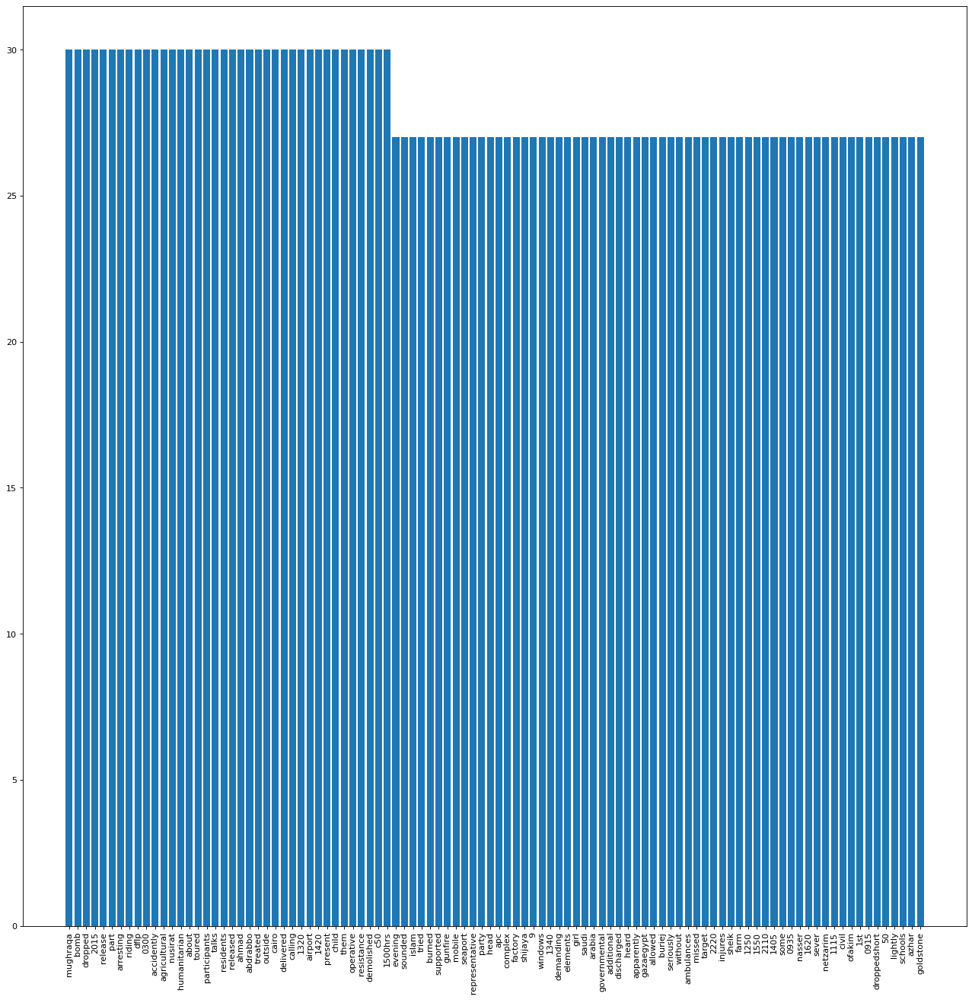

In [81]:
%matplotlib inline
import matplotlib.pyplot as plt

most_common = counts.most_common()[700:800]
plt.figure(figsize=(20, 20), dpi=80)
plt.xticks(rotation='vertical')
plt.bar([x[0] for x in most_common], [x[1] for x in most_common])

In [92]:
keywords = ['fired', 'f16', 'plane', 'fighter', 'strike', 'weapon', 'armor', 'armour', 'arm', 'dead', 'died', 'explosion', 'explosive', 'aircraft', 'force', 'unit', 'death', 'casualt', 'helicopter', 'drone', 'gun', 'shot', 'shoot', 'detonate', 'bulldozer', 'fire', 'injur', 'idf', 'milit', 'qassam', 'missile', 'troop', 'artillery', 'wound', 'rocket', 'explode', 'penetrate', 'fatalit', 'tank', 'iaf', 'grenade', 'damage', 'shell', 'mortar']

In [96]:
sorted(keywords)

['aircraft',
 'arm',
 'armor',
 'armour',
 'artillery',
 'bulldozer',
 'casualt',
 'damage',
 'dead',
 'death',
 'detonate',
 'died',
 'drone',
 'explode',
 'explosion',
 'explosive',
 'f16',
 'fatalit',
 'fighter',
 'fire',
 'fired',
 'force',
 'grenade',
 'gun',
 'helicopter',
 'iaf',
 'idf',
 'injur',
 'milit',
 'missile',
 'mortar',
 'penetrate',
 'plane',
 'qassam',
 'rocket',
 'shell',
 'shoot',
 'shot',
 'strike',
 'tank',
 'troop',
 'unit',
 'weapon',
 'wound']

In [94]:
len(keywords)

44

In [95]:
Counter(keywords)

Counter({'fired': 1,
         'f16': 1,
         'plane': 1,
         'fighter': 1,
         'strike': 1,
         'weapon': 1,
         'armor': 1,
         'armour': 1,
         'arm': 1,
         'dead': 1,
         'died': 1,
         'explosion': 1,
         'explosive': 1,
         'aircraft': 1,
         'force': 1,
         'unit': 1,
         'death': 1,
         'casualt': 1,
         'helicopter': 1,
         'drone': 1,
         'gun': 1,
         'shot': 1,
         'shoot': 1,
         'detonate': 1,
         'bulldozer': 1,
         'fire': 1,
         'injur': 1,
         'idf': 1,
         'milit': 1,
         'qassam': 1,
         'missile': 1,
         'troop': 1,
         'artillery': 1,
         'wound': 1,
         'rocket': 1,
         'explode': 1,
         'penetrate': 1,
         'fatalit': 1,
         'tank': 1,
         'iaf': 1,
         'grenade': 1,
         'damage': 1,
         'shell': 1,
         'mortar': 1})

In [100]:
18_655_365 / (8*2**20)

2.2238928079605103

date = datestamp
file_name = string
area = string
text = string